In [1]:
# Load Libraries
library(Seurat)
library(SeuratWrappers)
library(dplyr)
library(ggplot2)

# Set Working Directory
setwd("../")

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




# PRO Tumor

In [2]:
path.pro <- "GBMProject/XeniumData/TXP_O11-PRO" 
xenium.pro <- LoadXenium(path.pro, fov = "fov") # Load the Xenium data
xenium.pro <- subset(xenium.pro, subset = nCount_Xenium > 0) # remove cells with 0 counts

clusters <- read.csv("GBMProject/GBMOrganoid/CCspatialclusters_PROtxp.csv")
xenium.pro <- AddMetaData(object = xenium.pro, metadata = clusters, col.name = "cluster_cellcharter")

xenium.pro

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warn

An object of class Seurat 
541 features across 68900 samples within 4 assays 
Active assay: Xenium (266 features, 0 variable features)
 1 layer present: counts
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: fov

Warning message:
“Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead.”


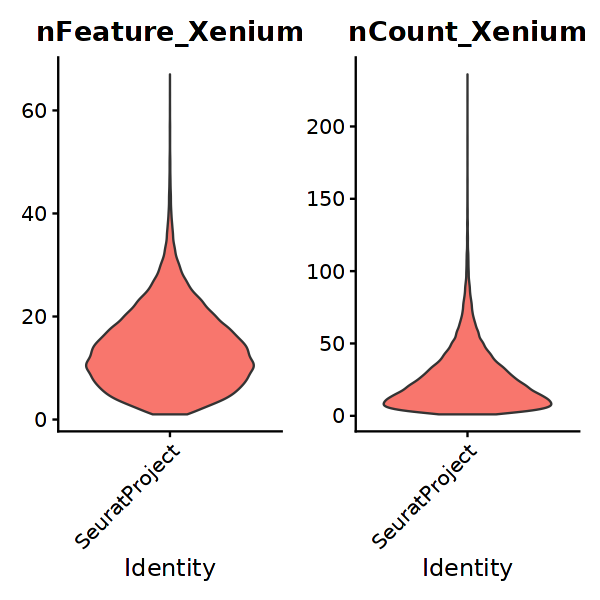

In [3]:
options(repr.plot.width=5, repr.plot.height=5) # To set the figure size in Jupyter
VlnPlot(xenium.pro, features = c("nFeature_Xenium", "nCount_Xenium"), ncol = 2, pt.size = 0)

In [4]:
xenium.pro <- NormalizeData(xenium.pro, verbose = FALSE)
xenium.pro <- FindVariableFeatures(xenium.pro, selection.method = "vst", verbose = FALSE)
xenium.pro <- ScaleData(xenium.pro, features = rownames(xenium.pro), verbose = FALSE)
xenium.pro <- RunPCA(xenium.pro, npcs = 20, features = rownames(xenium.pro), verbose = FALSE)
#ElbowPlot(xenium.pro, ndims = 30, reduction = "pca")

xenium.pro <- RunUMAP(xenium.pro, dims = 1:20, verbose = FALSE)
xenium.pro <- FindNeighbors(xenium.pro, reduction = "pca", dims = 1:20, verbose = FALSE)
xenium.pro <- FindClusters(xenium.pro, resolution = 0.2, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


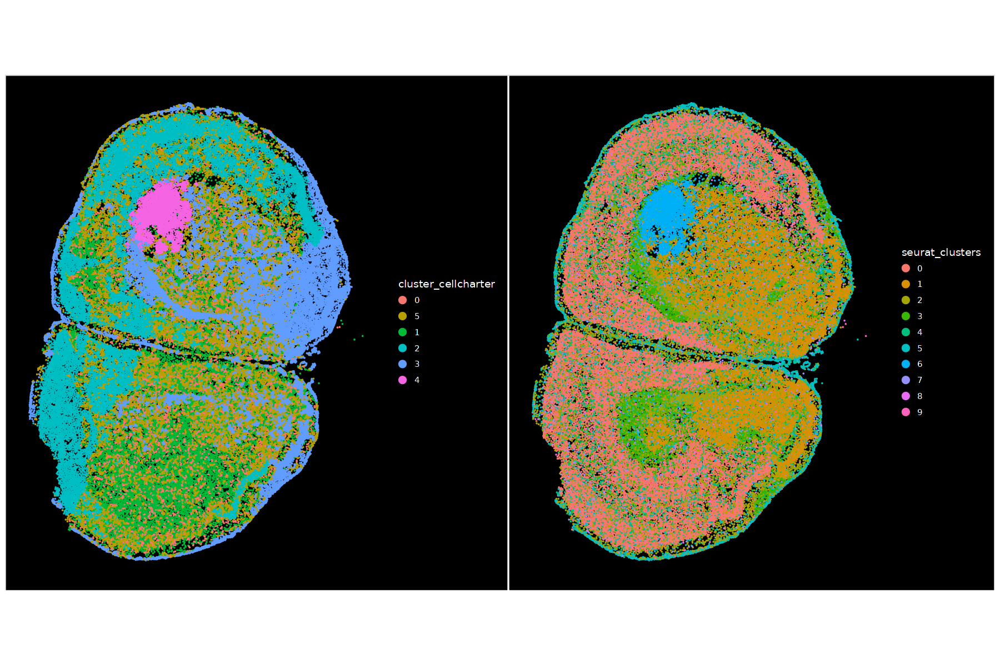

In [5]:
pc <- ImageDimPlot(xenium.pro, group.by="cluster_cellcharter", size = 0.75)
ps <- ImageDimPlot(xenium.pro, group.by="seurat_clusters", size = 0.75)

options(repr.plot.width = 15, repr.plot.height = 10)
pc | ps

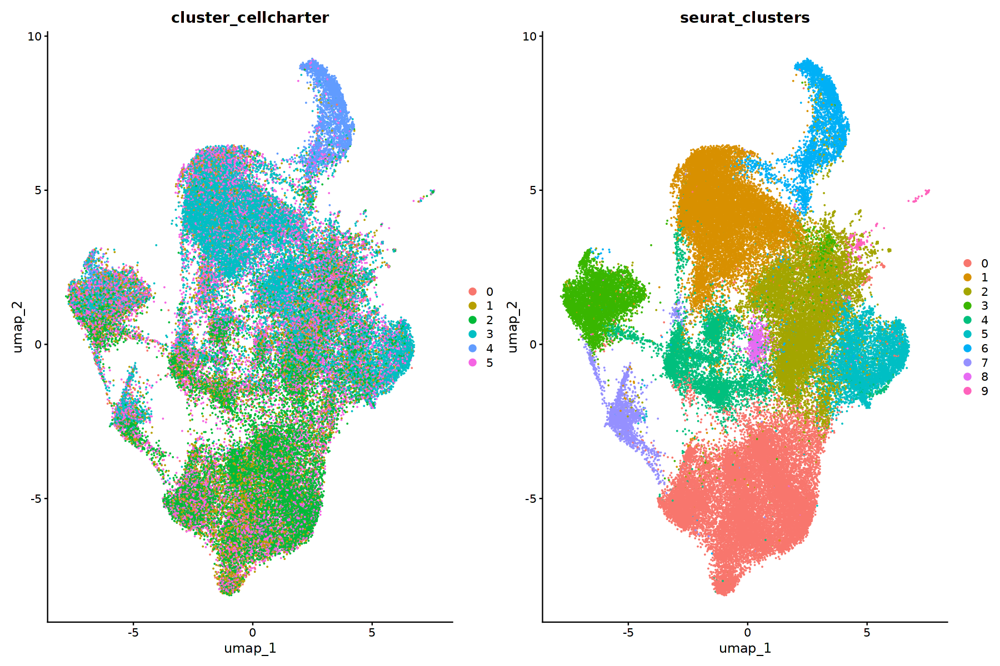

In [6]:
p1 <- DimPlot(xenium.pro, group.by="cluster_cellcharter")
p2 <- DimPlot(xenium.pro, group.by="seurat_clusters")

options(repr.plot.width = 15, repr.plot.height = 10)
p1 | p2

In [7]:
pro.cc.markers <- FindAllMarkers(xenium.pro, group.by="cluster_cellcharter", only.pos = TRUE)
write.csv(pro.cc.markers, file = "GBMProject/GBMOrganoid/GeneLists/CCclustermarkers_protumor.csv")

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9



In [ ]:
Idents(xenium.pro) <- "cluster_cellcharter"

markers.PRO.tumor <- FindMarkers(object = xenium.pro, test.use = "wilcox", ident.1 = "4")
markers.PRO.tumor$gene <- rownames(markers.PRO.tumor)
write.csv(markers.PRO.tumor, file = "GBMProject/GBMOrganoid/GeneLists/Markers_Wilcox_PROtumor.csv")

Warning message:
“Key ‘Xenium_’ taken, using ‘zoom_’ instead”
Warning message:
“Adding image with unordered cells”


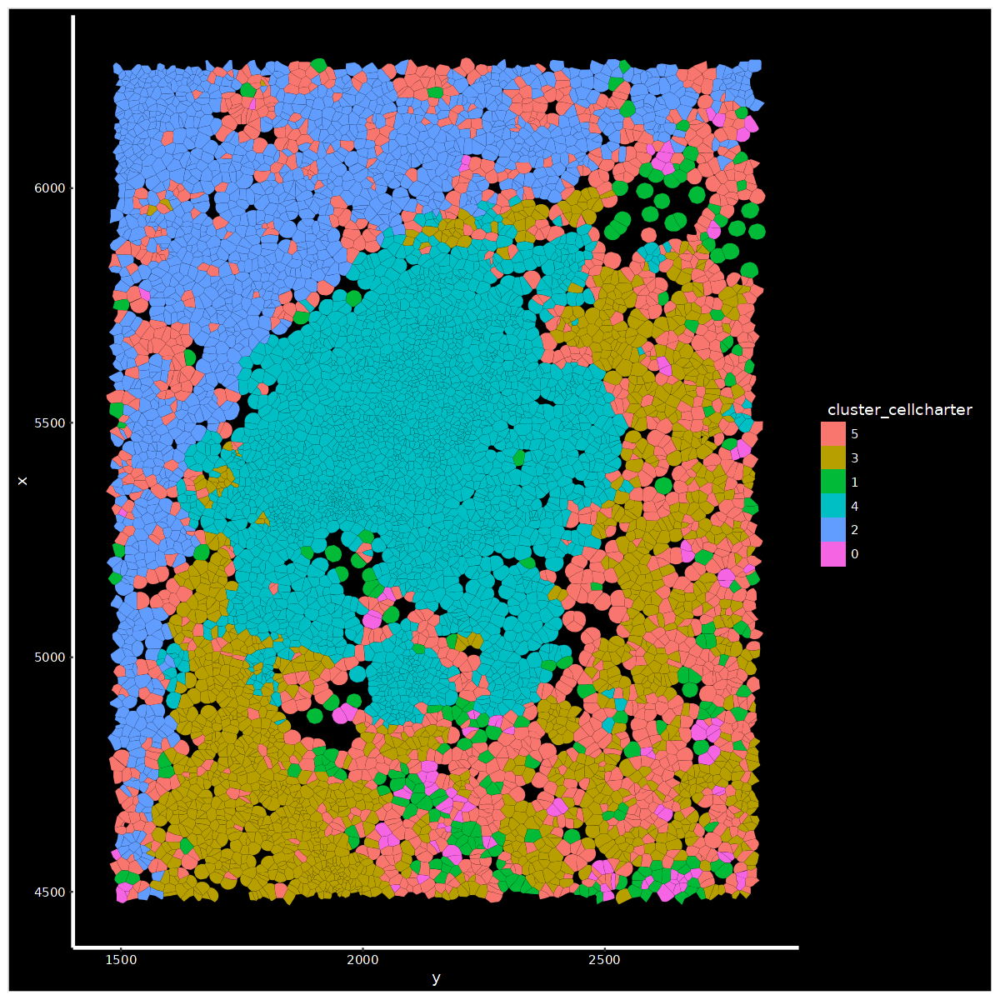

In [8]:
cropped.coords <- Crop(xenium.pro[["fov"]], x = c(1500, 2800), y = c(4500, 6250), coords = "plot")

xenium.pro[["zoom"]] <- cropped.coords

# visualize cropped area with cell segmentations & selected molecules
DefaultBoundary(xenium.pro[["zoom"]]) <- "segmentation"

options(repr.plot.width=10, repr.plot.height=10) # To set the figure size in Jupyter
ImageDimPlot(xenium.pro, fov = "zoom", group.by="cluster_cellcharter", axes = TRUE, border.color = "white", border.size = 0.0, coord.fixed = FALSE)

In [9]:
Idents(xenium.pro) <- 'cluster_cellcharter'
sub.pro <- subset(xenium.pro, idents='4')

Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


In [10]:
sub.pro <- NormalizeData(sub.pro, verbose = FALSE)
sub.pro <- FindVariableFeatures(sub.pro, selection.method = "vst", verbose = FALSE)
sub.pro <- ScaleData(sub.pro, features = rownames(sub.pro), verbose = FALSE)
sub.pro <- RunPCA(sub.pro, npcs = 30, features = rownames(sub.pro), verbose = FALSE)
#ElbowPlot(sub.pro, ndims = 30, reduction = "pca")

Warning message:
“Number of dimensions changing from 20 to 30”


In [11]:
sub.pro <- RunUMAP(sub.pro, dims = 1:20, verbose = FALSE)
sub.pro <- FindNeighbors(sub.pro, reduction = "pca", dims = 1:20, verbose = FALSE)
sub.pro <- FindClusters(sub.pro, resolution = 0.2, verbose = FALSE)

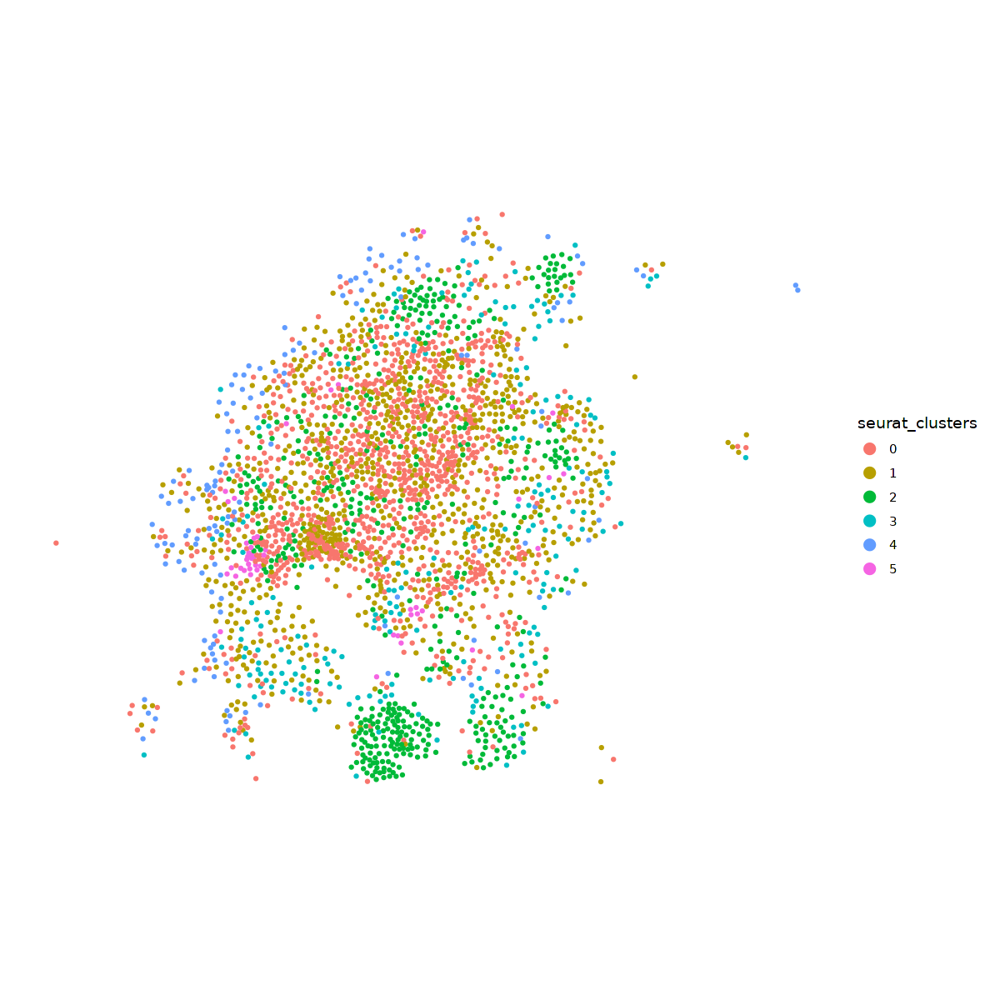

In [12]:
#cropped.coords <- Crop(sub.pro[["fov"]], x = c(1500, 2800), y = c(4500, 6250), coords = "plot")
#sub.pro[["zoom"]] <- cropped.coords

options(repr.plot.width = 10, repr.plot.height = 10)
ImageDimPlot(sub.pro, size = 1.5, group.by = 'seurat_clusters', dark.background = F)

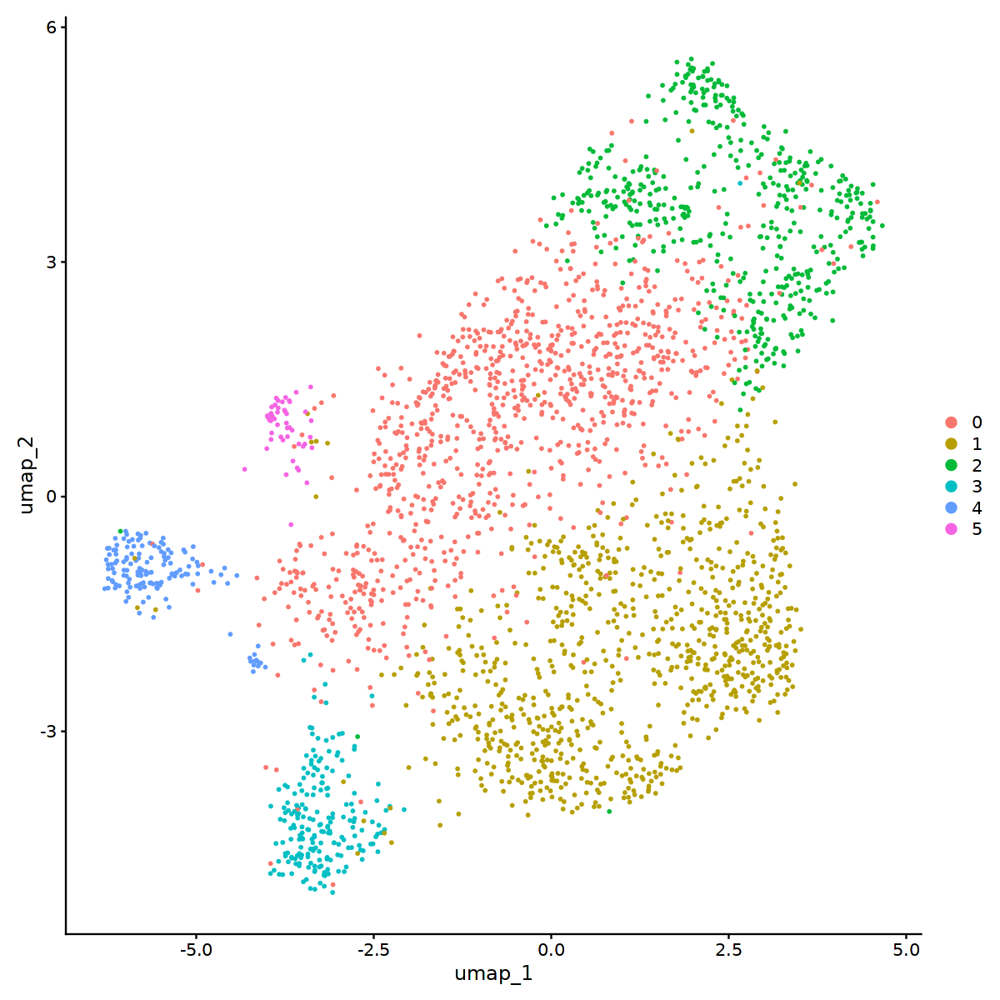

In [13]:
options(repr.plot.width = 10, repr.plot.height = 10)
DimPlot(sub.pro)

In [14]:
sub.pro.markers <- FindAllMarkers(sub.pro, only.pos = TRUE)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5



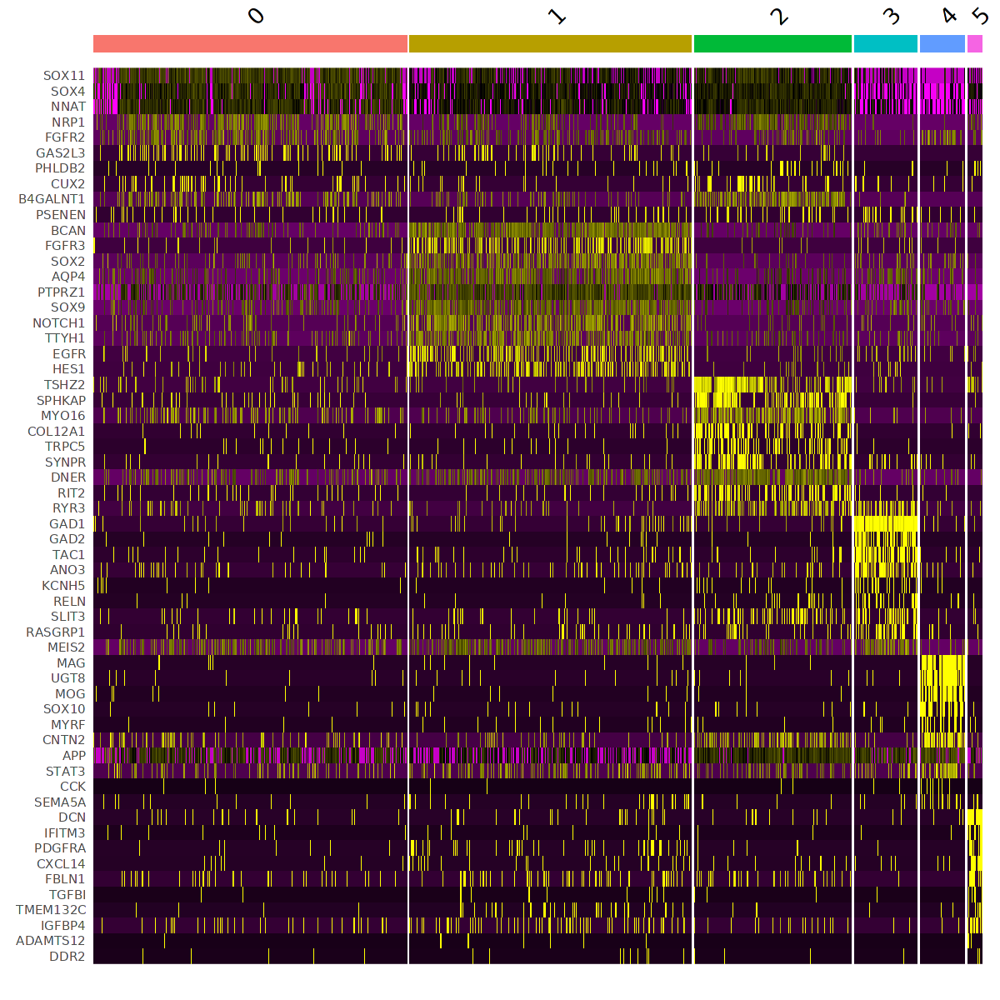

In [15]:
sub.pro.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.1) %>%
    slice_head(n = 10) %>%
    ungroup() -> top10
DoHeatmap(sub.pro, features = top10$gene) + NoLegend()

In [16]:
sub.pro <- BuildNicheAssay(object = sub.pro, fov = "zoom", group.by = "seurat_clusters",
    niches.k = 4, neighbors.k = 30)

Computing nearest neighbor graph

Centering and scaling data matrix



In [17]:
Boundaries(sub.pro[['fov']])

[1] "centroids"    "segmentation"

Warning message:
“No FOV associated with assay 'niche', using global default FOV”


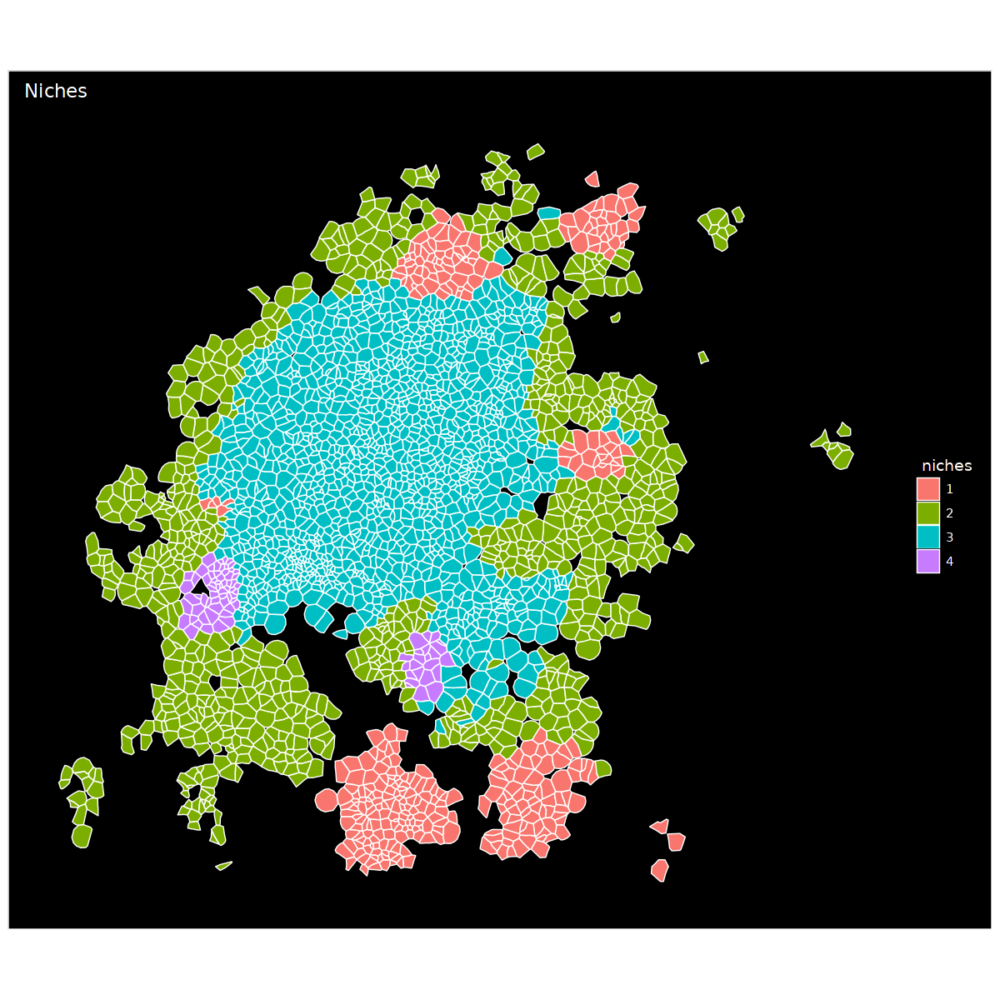

In [18]:
ImageDimPlot(sub.pro, boundaries = 'segmentation', group.by = "niches", 
             #cols=c("1"="forestgreen","2"="mediumorchid","3"="dodgerblue3","4"=""), 
             size = 1.5, dark.background = T, border.color = "white") + ggtitle("Niches")

In [19]:
Idents(sub.pro) <- "niches"
DefaultAssay(sub.pro) <- "Xenium"
niche.pro.markers <- FindAllMarkers(sub.pro, only.pos = TRUE)

write.csv(niche.pro.markers, file = "GBMProject/GBMOrganoid/GeneLists/nichemarkers_protumor.csv")

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4



Warning message:
“Removed 234 rows containing missing values or values outside the scale range
(`geom_point()`).”


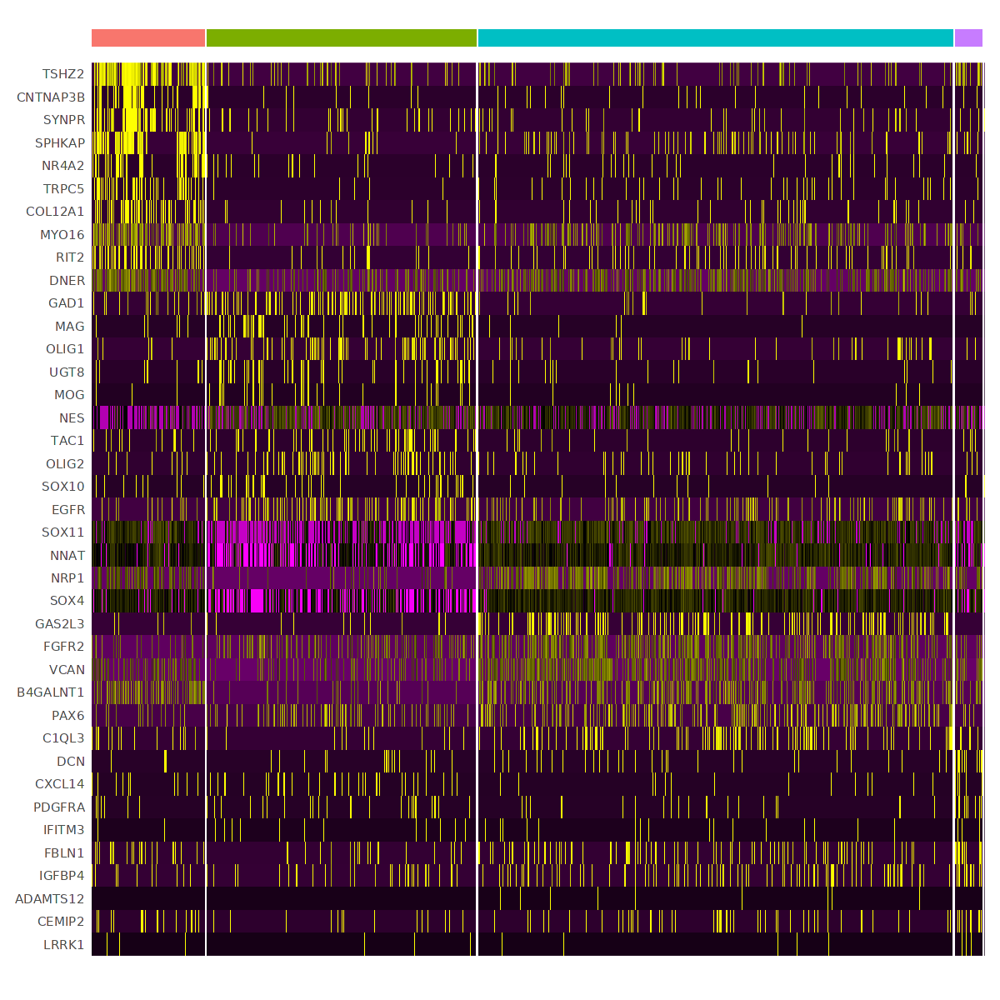

In [20]:
niche.pro.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.1) %>%
    slice_head(n = 10) %>%
    ungroup() -> top10

DoHeatmap(sub.pro, features = top10$gene, label=FALSE) + NoLegend()

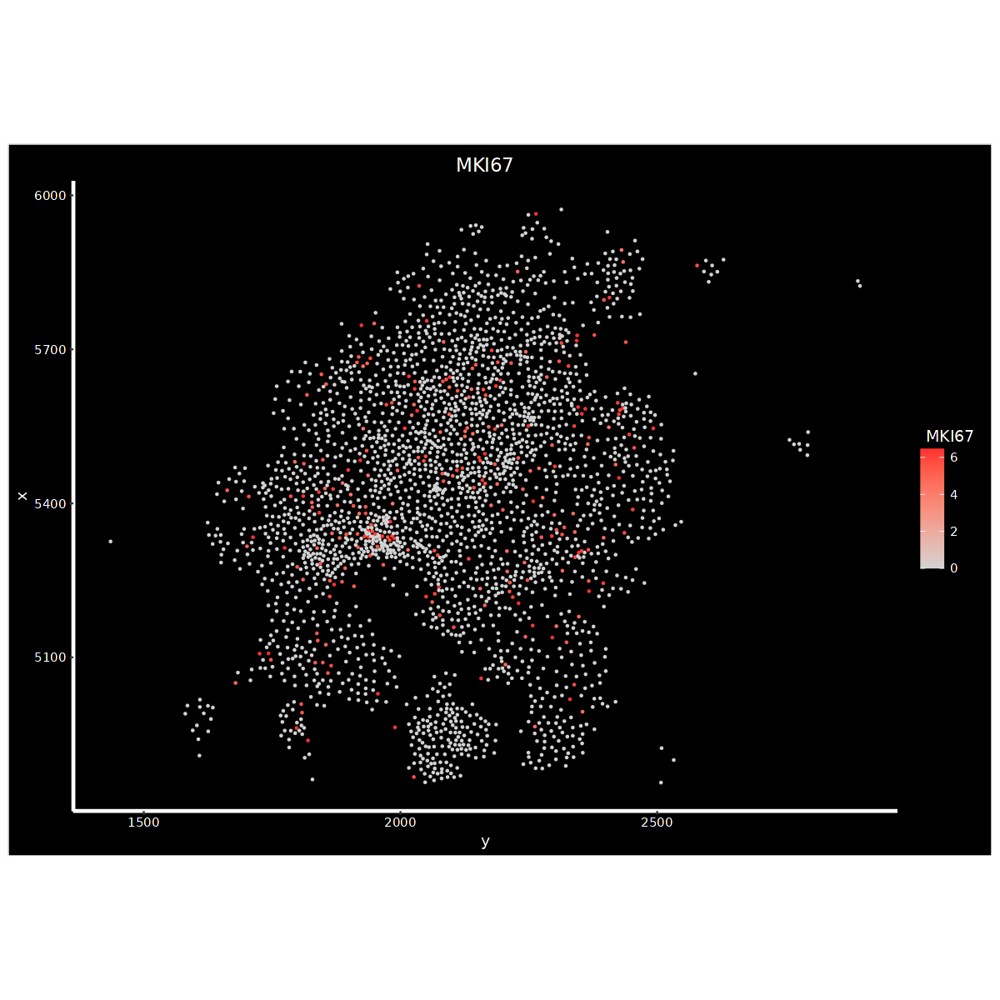

In [21]:
ImageFeaturePlot(sub.pro, fov = "fov", features = c("MKI67"), size = 1, axes = TRUE, max.cutoff = "q90")

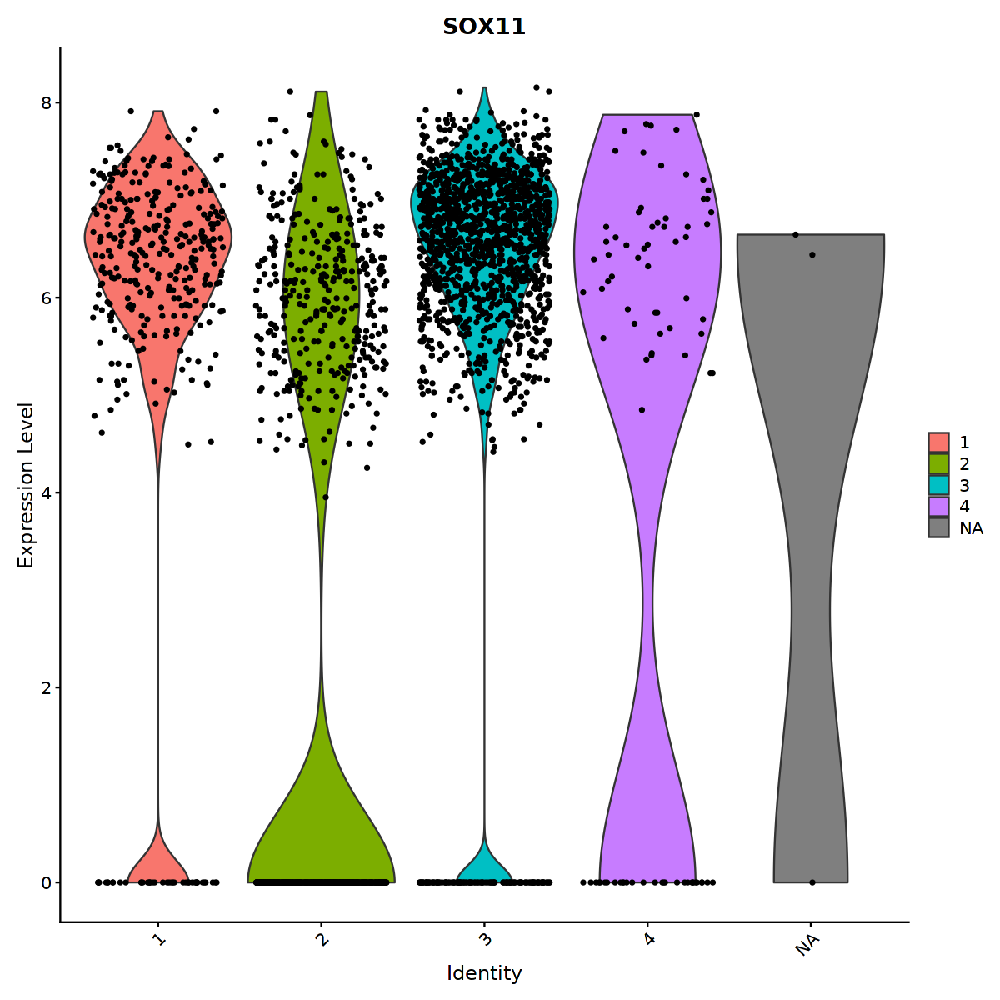

In [22]:
VlnPlot(sub.pro, group.by='niches', features='SOX11')

In [23]:
saveRDS(sub.pro, "GBMProject/GBMOrganoid/Checkpoints/protxp_subset.rds")

# MES Tumor

In [24]:
path.mes <- "GBMProject/XeniumData/TXP_O8-MES-1" 
xenium.mes <- LoadXenium(path.mes, fov = "fov") # Load the Xenium data
xenium.mes <- subset(xenium.mes, subset = nCount_Xenium > 0) # remove cells with 0 counts

clusters <- read.csv("GBMProject/GBMOrganoid/CCspatialclusters_MEStxp.csv")
xenium.mes <- AddMetaData(object = xenium.mes, metadata = clusters, col.name = "cluster_cellcharter")

xenium.mes

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warn

An object of class Seurat 
541 features across 39277 samples within 4 assays 
Active assay: Xenium (266 features, 0 variable features)
 1 layer present: counts
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: fov

Warning message:
“Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead.”


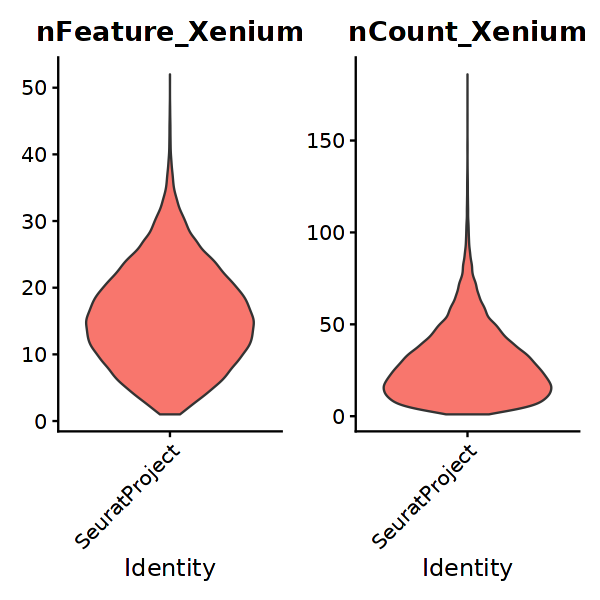

In [25]:
options(repr.plot.width=5, repr.plot.height=5) # To set the figure size in Jupyter
VlnPlot(xenium.mes, features = c("nFeature_Xenium", "nCount_Xenium"), ncol = 2, pt.size = 0)

In [26]:
xenium.mes <- NormalizeData(xenium.mes, verbose = FALSE)
xenium.mes <- FindVariableFeatures(xenium.mes, selection.method = "vst", verbose = FALSE)
xenium.mes <- ScaleData(xenium.mes, features = rownames(xenium.mes), verbose = FALSE)
xenium.mes <- RunPCA(xenium.mes, npcs = 20, features = rownames(xenium.mes), verbose = FALSE)
#ElbowPlot(xenium.pro, ndims = 30, reduction = "pca")

xenium.mes <- RunUMAP(xenium.mes, dims = 1:20, verbose = FALSE)
xenium.mes <- FindNeighbors(xenium.mes, reduction = "pca", dims = 1:20, verbose = FALSE)
xenium.mes <- FindClusters(xenium.mes, resolution = 0.2, verbose = FALSE)

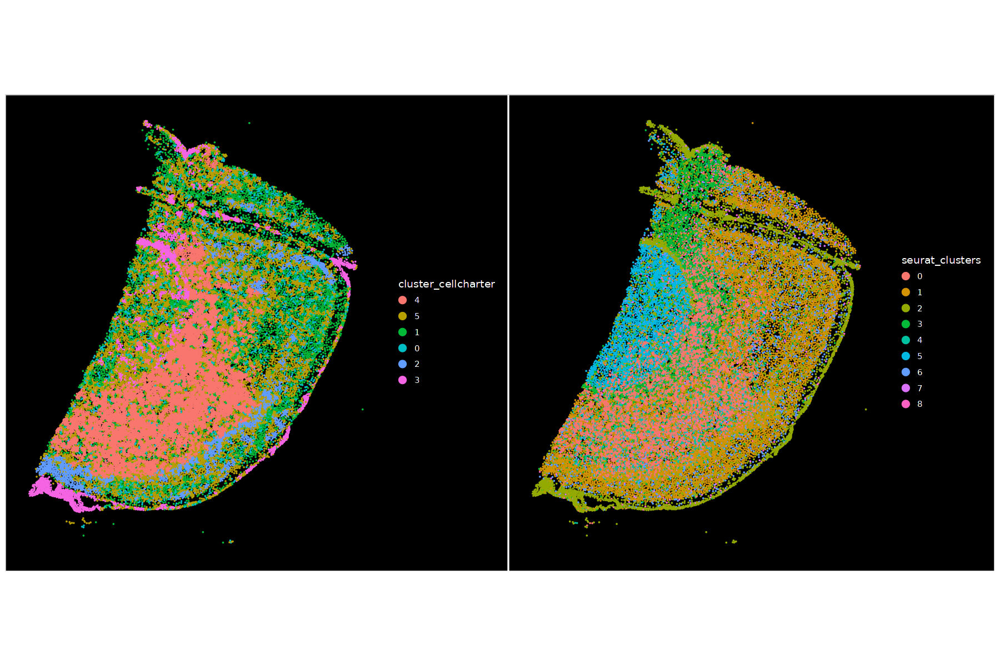

In [27]:
pc <- ImageDimPlot(xenium.mes, group.by="cluster_cellcharter", size = 0.75)
ps <- ImageDimPlot(xenium.mes, group.by="seurat_clusters", size = 0.75)

options(repr.plot.width = 15, repr.plot.height = 10)
pc | ps

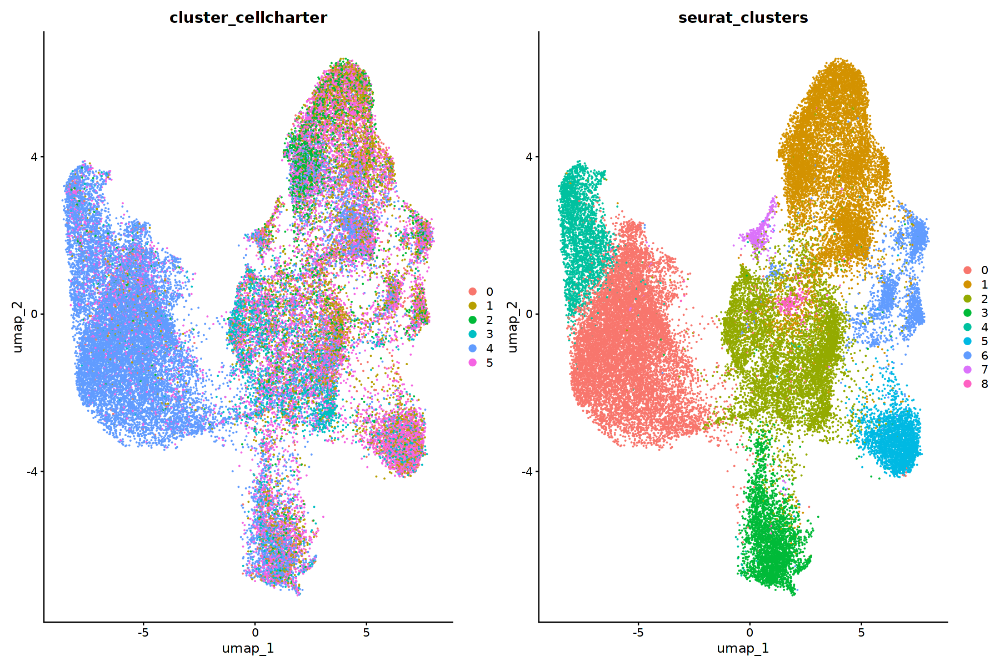

In [28]:
p1 <- DimPlot(xenium.mes, group.by="cluster_cellcharter")
p2 <- DimPlot(xenium.mes, group.by="seurat_clusters")

options(repr.plot.width = 15, repr.plot.height = 10)
p1 | p2

In [29]:
mes.cc.markers <- FindAllMarkers(xenium.mes, group.by="cluster_cellcharter", only.pos = TRUE)
write.csv(mes.cc.markers, file = "GBMProject/GBMOrganoid/GeneLists/CCclustermarkers_mestumor.csv")

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8



In [30]:
Idents(xenium.mes) <- 'cluster_cellcharter'
sub.mes <- subset(xenium.mes, idents='4')

Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


In [31]:
sub.mes <- NormalizeData(sub.mes, verbose = FALSE)
sub.mes <- FindVariableFeatures(sub.mes, selection.method = "vst", verbose = FALSE)
sub.mes <- ScaleData(sub.mes, features = rownames(sub.mes), verbose = FALSE)
sub.mes <- RunPCA(sub.mes, npcs = 30, features = rownames(sub.mes), verbose = FALSE)
#ElbowPlot(sub.pro, ndims = 30, reduction = "pca")

Warning message:
“Number of dimensions changing from 20 to 30”


In [32]:
sub.mes <- RunUMAP(sub.mes, dims = 1:20, verbose = FALSE)
sub.mes <- FindNeighbors(sub.mes, reduction = "pca", dims = 1:20, verbose = FALSE)
sub.mes <- FindClusters(sub.mes, resolution = 0.2, verbose = FALSE)

In [35]:
sub.mes.markers <- FindAllMarkers(sub.mes, only.pos = TRUE)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5



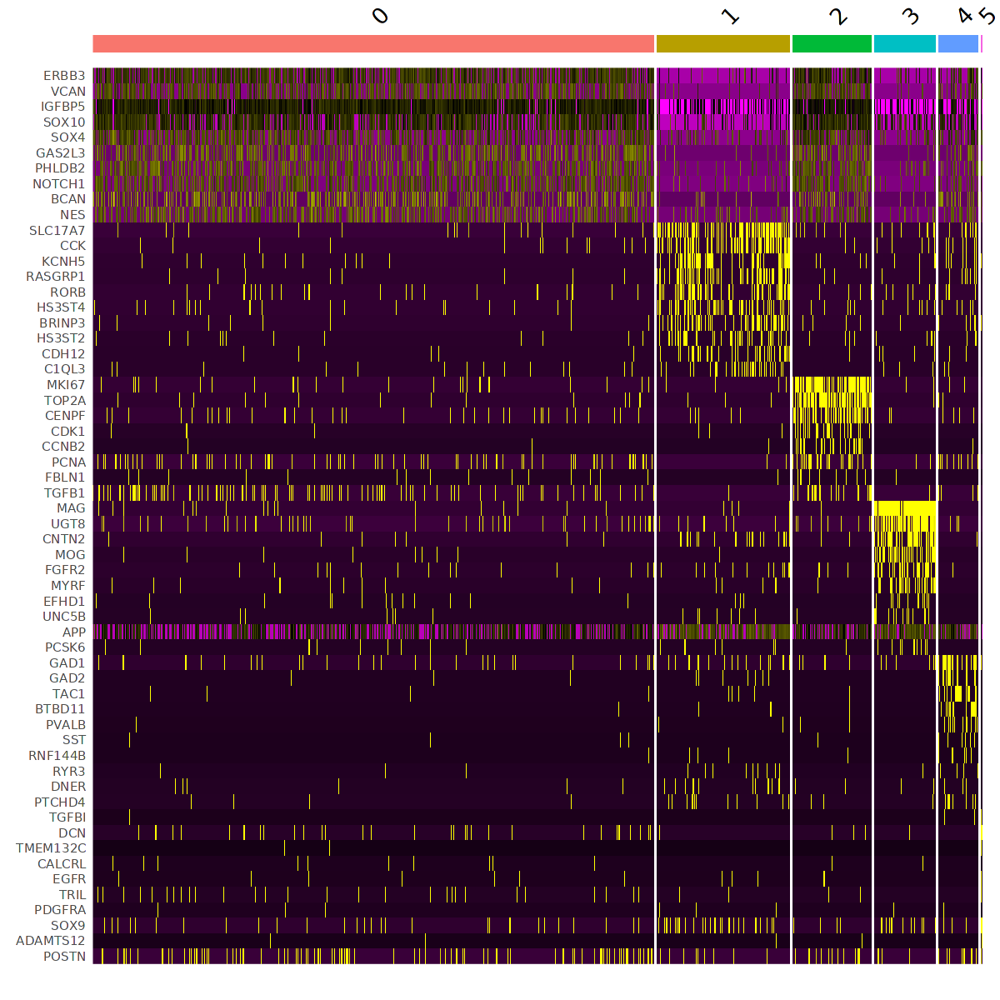

In [36]:
sub.mes.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.1) %>%
    slice_head(n = 10) %>%
    ungroup() -> top10
DoHeatmap(sub.mes, features = top10$gene) + NoLegend()

In [37]:
sub.mes <- BuildNicheAssay(object = sub.mes, fov = 'fov', group.by = "seurat_clusters",
    niches.k = 4, neighbors.k = 30)

Computing nearest neighbor graph

Centering and scaling data matrix



Warning message:
“No FOV associated with assay 'niche', using global default FOV”


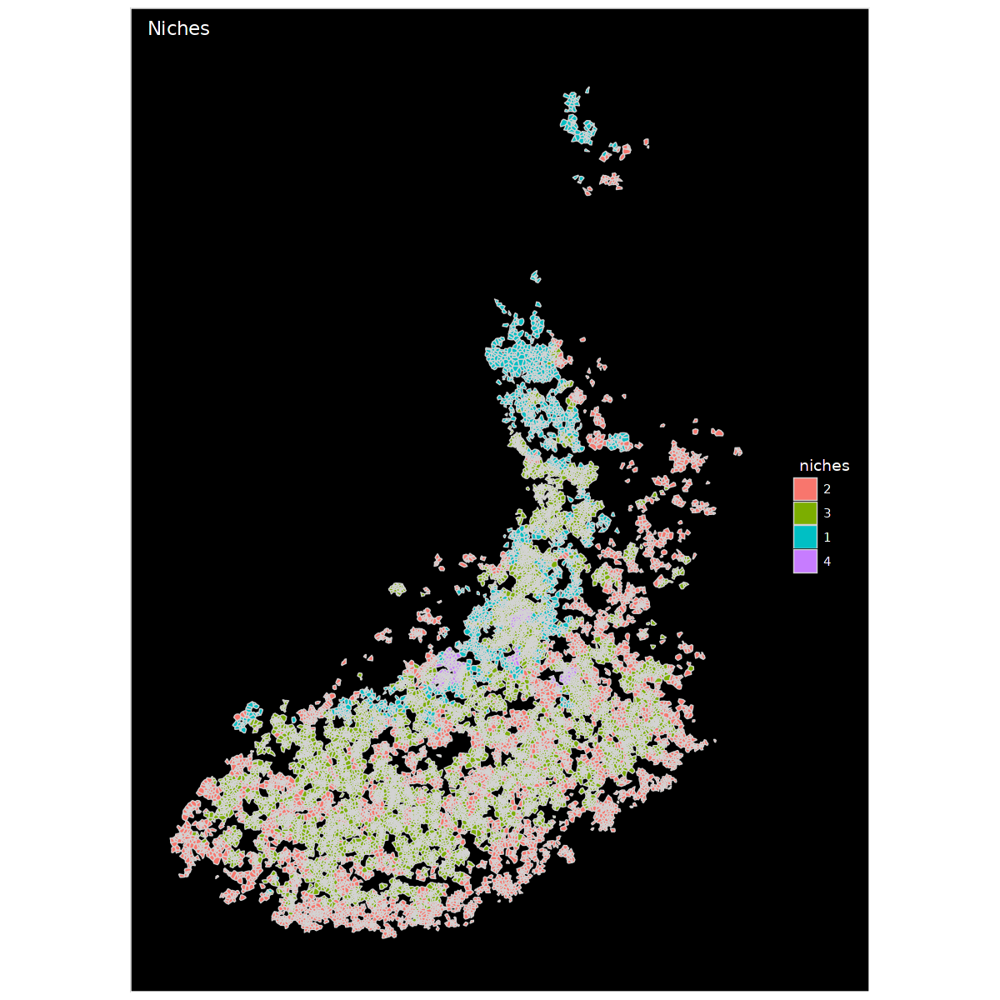

In [38]:
ImageDimPlot(sub.mes, boundaries = 'segmentation', group.by = "niches", 
             #cols=c("1"="forestgreen","2"="mediumorchid","3"="dodgerblue3","4"=""), 
             size = 1.5, dark.background = T, border.color = "lightgrey") + ggtitle("Niches")

In [39]:
Idents(sub.mes) <- "niches"
DefaultAssay(sub.mes) <- "Xenium"
niche.mes.markers <- FindAllMarkers(sub.mes, only.pos = TRUE)

write.csv(niche.mes.markers, file = "GBMProject/GBMOrganoid/GeneLists/nichemarkers_mestumor.csv")

Calculating cluster 2

Calculating cluster 3

Calculating cluster 1

Calculating cluster 4



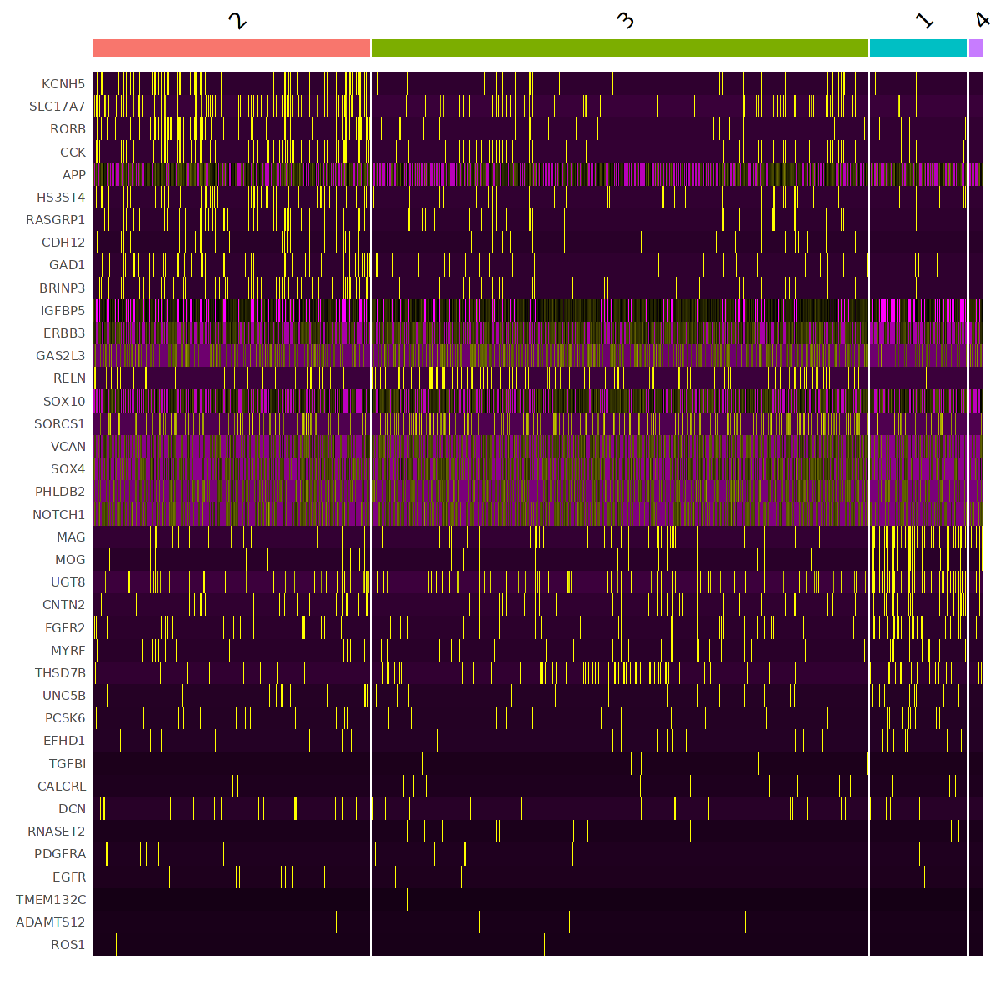

In [40]:
niche.mes.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.1) %>%
    slice_head(n = 10) %>%
    ungroup() -> top10

DoHeatmap(sub.mes, features = top10$gene) + NoLegend()

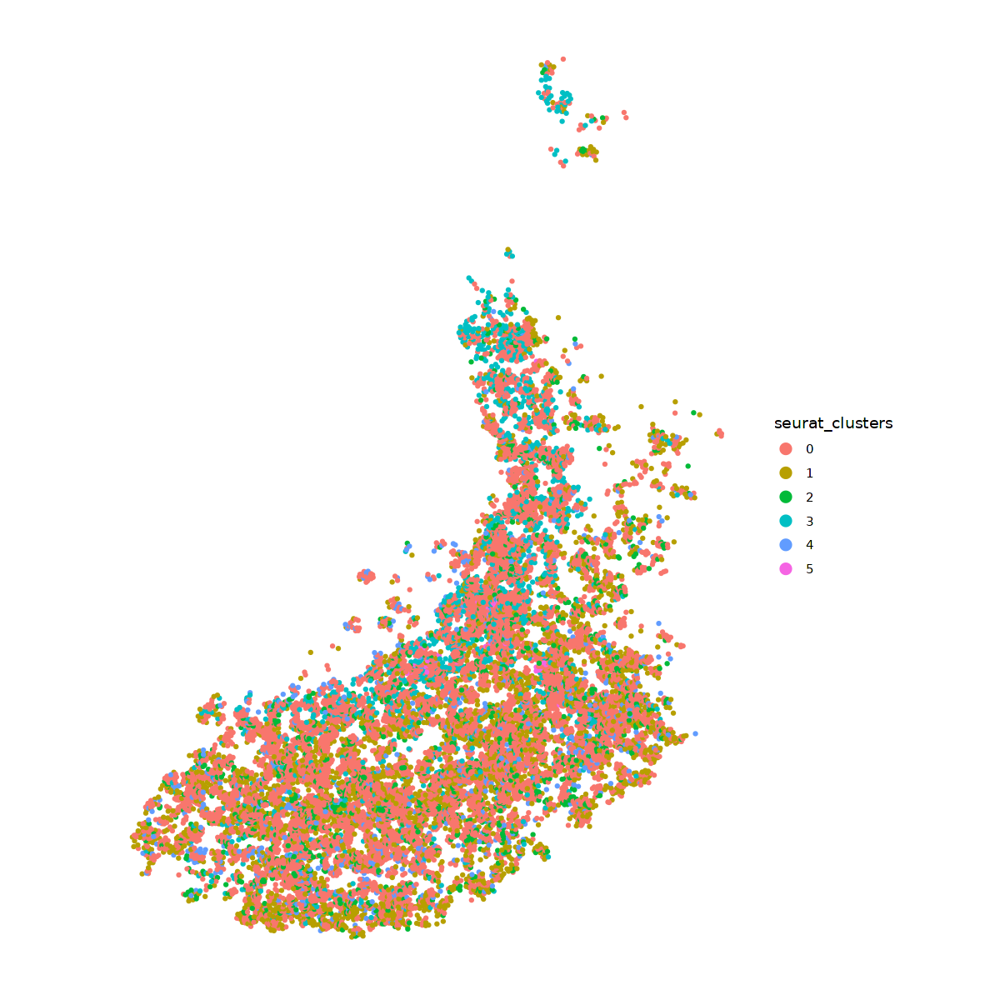

In [33]:
options(repr.plot.width = 10, repr.plot.height = 10)
ImageDimPlot(sub.mes, size = 1.5, group.by = 'niches', dark.background = F)

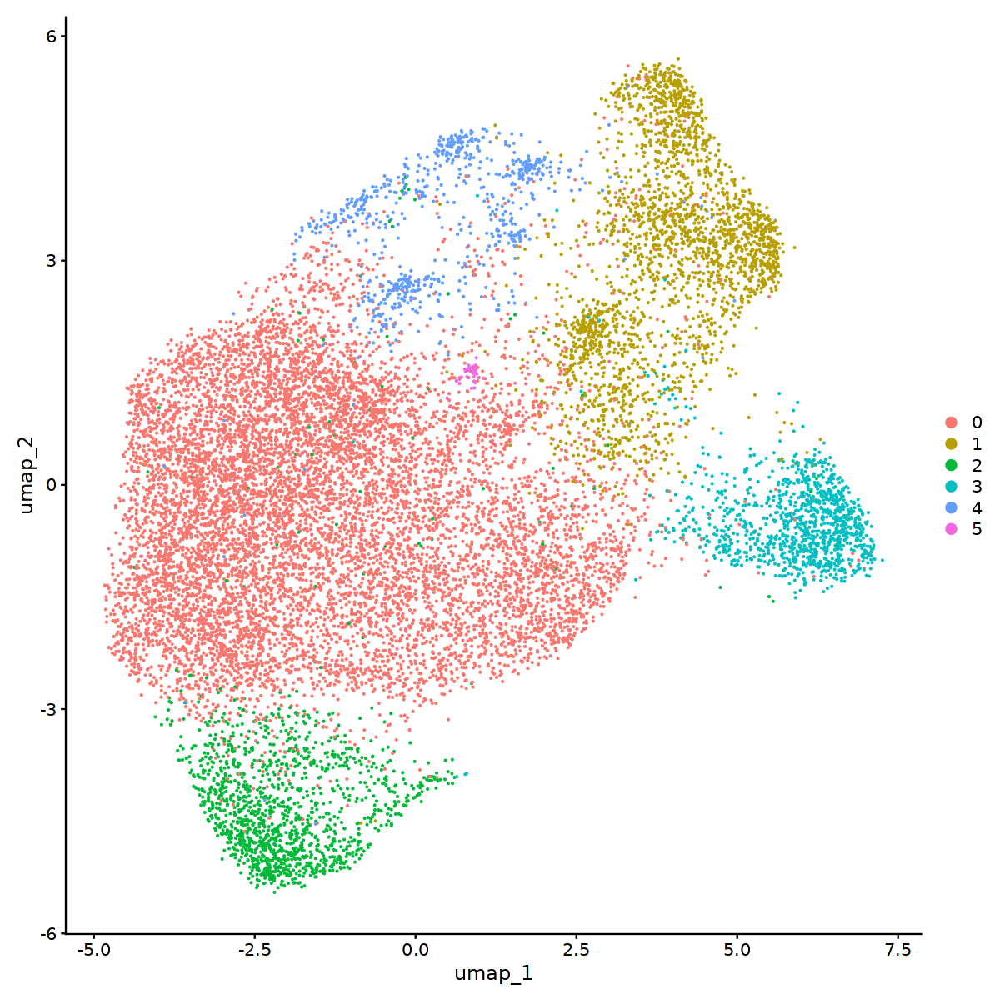

In [34]:
options(repr.plot.width = 10, repr.plot.height = 10)
DimPlot(sub.mes)

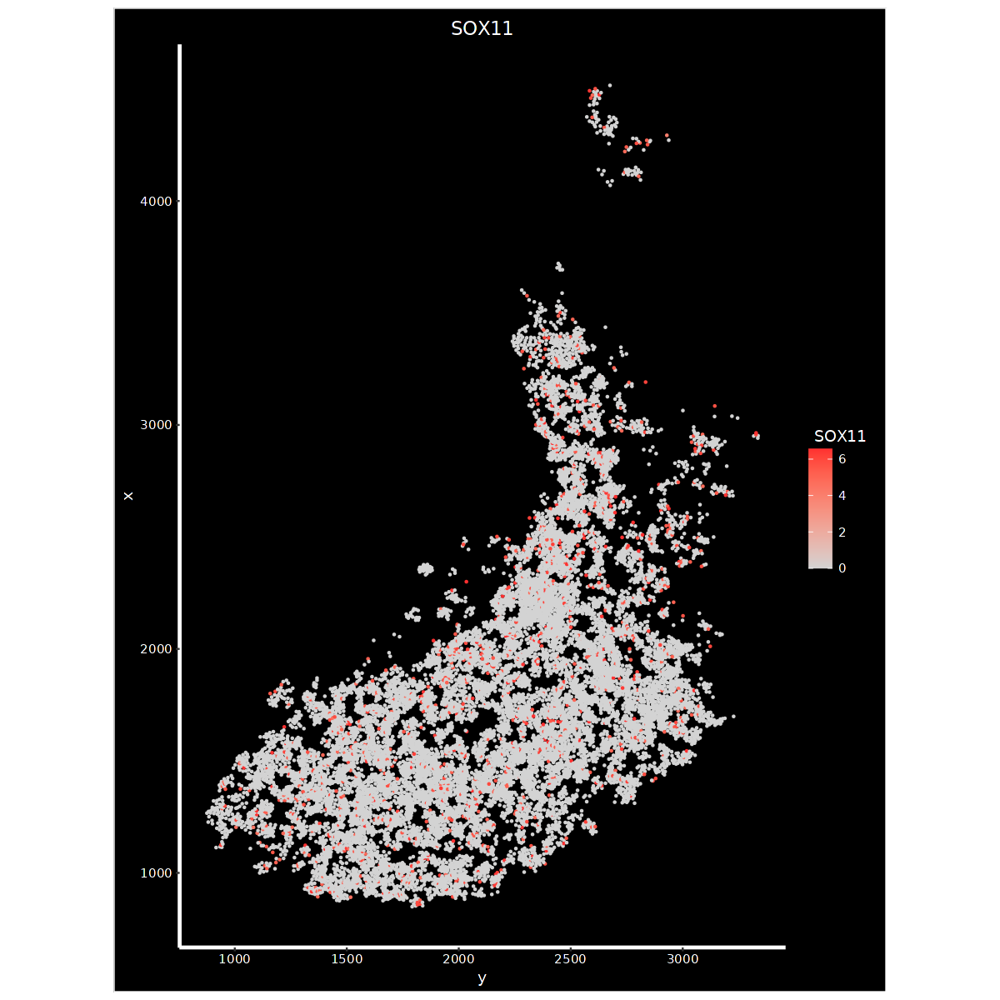

In [41]:
ImageFeaturePlot(sub.mes, fov = "fov", features = "SOX11", size = 1, axes = TRUE, max.cutoff = "q90")

In [42]:
saveRDS(sub.mes, "GBMProject/GBMOrganoid/Checkpoints/mestxp_subset.rds")

# Patient Tumor

In [2]:
path.pt <- "GBMProject/XeniumData/GBMBrain" 
xenium.pt <- LoadXenium(path.pt, fov = "fov") # Load the Xenium data
xenium.pt <- subset(xenium.pt, subset = nCount_Xenium > 0) # remove cells with 0 counts

xenium.pt

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warn

An object of class Seurat 
541 features across 40884 samples within 4 assays 
Active assay: Xenium (319 features, 0 variable features)
 1 layer present: counts
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 1 spatial field of view present: fov

Warning message:
“Default search for "data" layer in "Xenium" assay yielded no results; utilizing "counts" layer instead.”


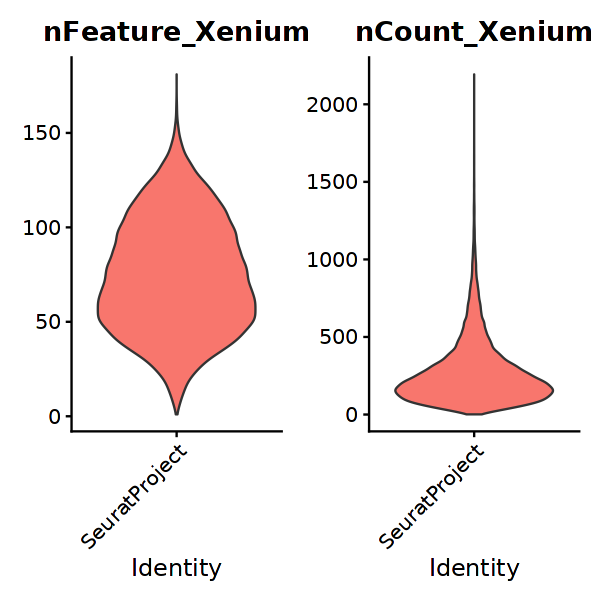

In [3]:
options(repr.plot.width=5, repr.plot.height=5) # To set the figure size in Jupyter
VlnPlot(xenium.pt, features = c("nFeature_Xenium", "nCount_Xenium"), ncol = 2, pt.size = 0)

In [4]:
xenium.pt <- NormalizeData(xenium.pt, verbose = FALSE)
xenium.pt <- FindVariableFeatures(xenium.pt, selection.method = "vst", verbose = FALSE)
xenium.pt <- ScaleData(xenium.pt, features = rownames(xenium.pt), verbose = FALSE)
xenium.pt <- RunPCA(xenium.pt, npcs = 20, features = rownames(xenium.pt), verbose = FALSE)
#ElbowPlot(xenium.pro, ndims = 30, reduction = "pca")

xenium.pt <- RunUMAP(xenium.pt, dims = 1:20, verbose = FALSE)
xenium.pt <- FindNeighbors(xenium.pt, reduction = "pca", dims = 1:20, verbose = FALSE)
xenium.pt <- FindClusters(xenium.pt, resolution = 0.2, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


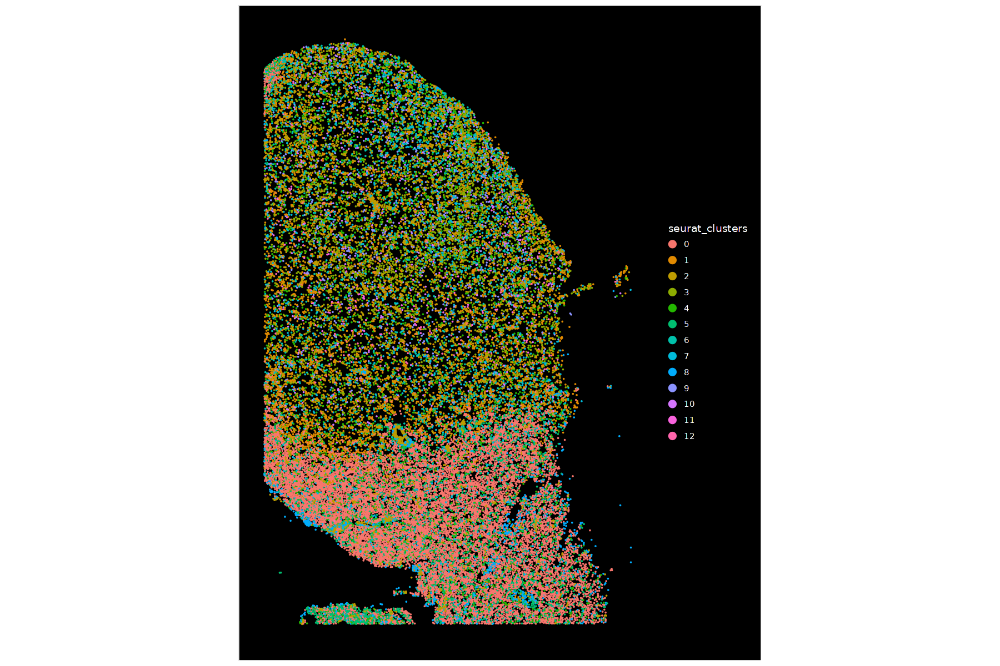

In [5]:
#pc <- ImageDimPlot(xenium.mes, group.by="cluster_cellcharter", size = 0.75)
ps <- ImageDimPlot(xenium.pt, group.by="seurat_clusters", size = 0.75)

options(repr.plot.width = 15, repr.plot.height = 10)
ps

In [6]:
xenium.pt <- BuildNicheAssay(object = xenium.pt, fov = 'fov', group.by = "seurat_clusters",
    niches.k = 4, neighbors.k = 30)

Computing nearest neighbor graph

Centering and scaling data matrix



In [7]:
Idents(xenium.pt) <- "niches"
DefaultAssay(xenium.pt) <- "Xenium"
niche.pt.markers <- FindAllMarkers(xenium.pt, only.pos = TRUE)

write.csv(niche.pt.markers, file = "GBMProject/GBMOrganoid/GeneLists/nichemarkers_PTtumor.csv")

Calculating cluster 4

Calculating cluster 1

Calculating cluster 3

Calculating cluster 2



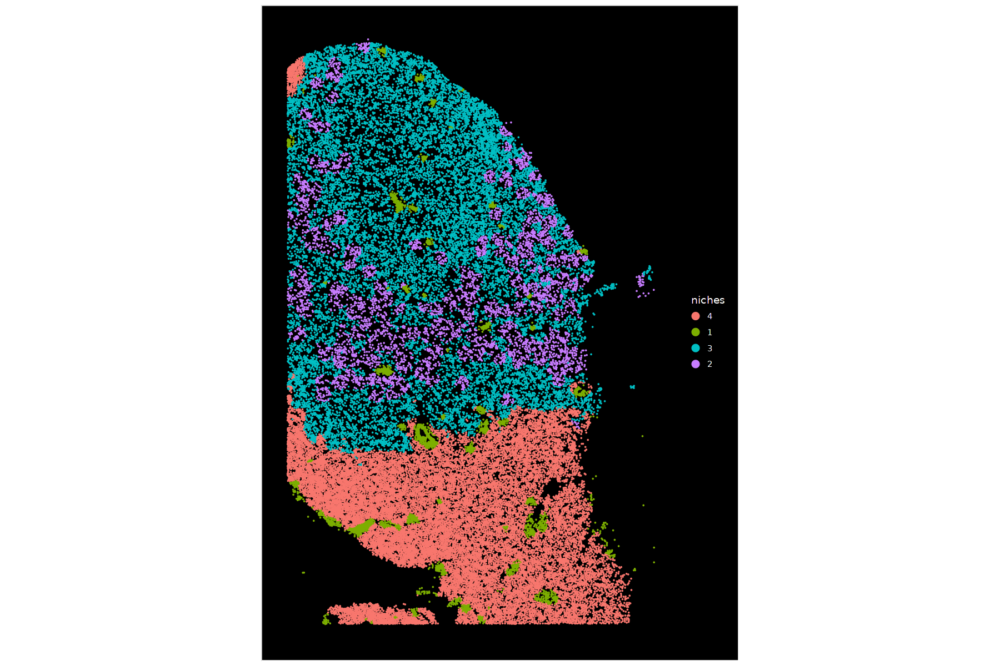

In [8]:
#pc <- ImageDimPlot(xenium.mes, group.by="cluster_cellcharter", size = 0.75)
ps <- ImageDimPlot(xenium.pt, group.by="niches", size = 0.75)

options(repr.plot.width = 15, repr.plot.height = 10)
ps

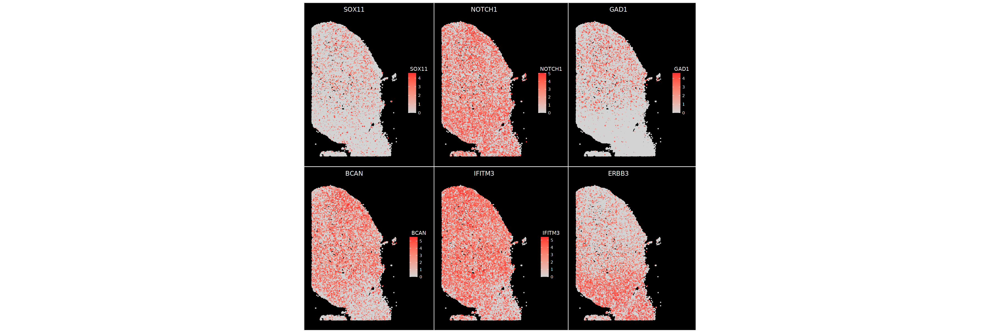

In [9]:
options(repr.plot.width=30, repr.plot.height=10)
ImageFeaturePlot(xenium.pt, fov = "fov", features = c("SOX11","NOTCH1","GAD1","BCAN","IFITM3","ERBB3"), 
                 combine=TRUE, size=1, axes=FALSE, max.cutoff = "q90") + NoLegend()

Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”


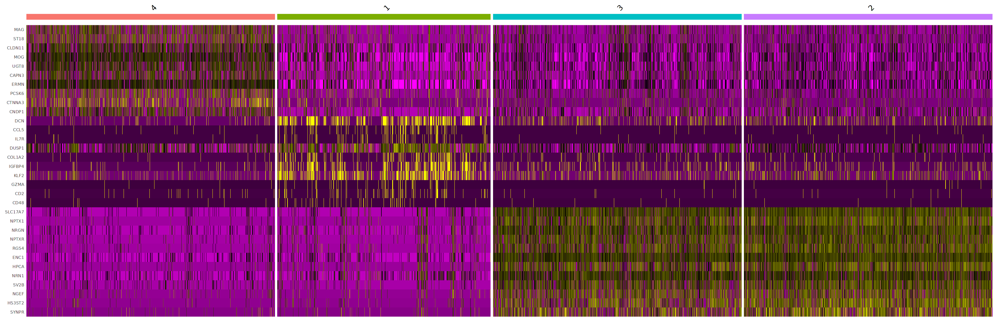

In [10]:
niche.pt.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 0.1) %>%
    slice_head(n = 10) %>%
    ungroup() -> top10

DoHeatmap(subset(xenium.pt, downsample = 3000), 
          features = top10$gene) + NoLegend()

In [11]:
saveRDS(xenium.pt, "GBMProject/GBMOrganoid/Checkpoints/patient.rds")